In [1]:
import tensorflow as tf
print("TensorFlow GPUs:", tf.config.list_physical_devices('GPU'))

TensorFlow GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
"""
UAE Properties Dataset Analysis
Complete Machine Learning Workflow with Proper Train/Val/Test Split
"""

# =============================================================================
# IMPORT LIBRARIES & LOAD DATA
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv('dubai_properties.csv')
# Using full dataset (all UAE cities)
print(f"Total properties: {len(df):,}")
print(f"Cities: {df['City'].unique()}")


print("="*80)
print("DATASET OVERVIEW")
print("="*80)
print(f"Dataset shape: {df.shape}")
print(f"\nColumn names and types:")
print(df.dtypes)
print(f"\nFirst few rows:")
print(df.head())


Total properties: 73,742
Cities: ['Abu Dhabi' 'Ajman' 'Al Ain' 'Dubai' 'Fujairah' 'Ras Al Khaimah'
 'Sharjah' 'Umm Al Quwain']
DATASET OVERVIEW
Dataset shape: (73742, 17)

Column names and types:
Address                    object
Rent                        int64
Beds                        int64
Baths                       int64
Type                       object
Area_in_sqft                int64
Rent_per_sqft             float64
Rent_category              object
Frequency                  object
Furnishing                 object
Purpose                    object
Posted_date                object
Age_of_listing_in_days      int64
Location                   object
City                       object
Latitude                  float64
Longitude                 float64
dtype: object

First few rows:
                                             Address    Rent  Beds  Baths  \
0  The Gate Tower 2, The Gate Tower, Shams Gate D...  124000     3      4   
1                Water's Edge, Yas Island

In [3]:

# --- Split ---
train, temp = train_test_split(df, test_size=0.4, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# EDA on Train data

In [4]:
print("=== BASIC SUMMARY ===")

print("\nRent Range:")
print("Min Rent:", train['Rent'].min())
print("Max Rent:", train['Rent'].max())

print("\nArea Range:")
print("Min Area:", train['Area_in_sqft'].min())
print("Max Area:", train['Area_in_sqft'].max())


=== BASIC SUMMARY ===

Rent Range:
Min Rent: 0
Max Rent: 8000000

Area Range:
Min Area: 74
Max Area: 210254


<Axes: >

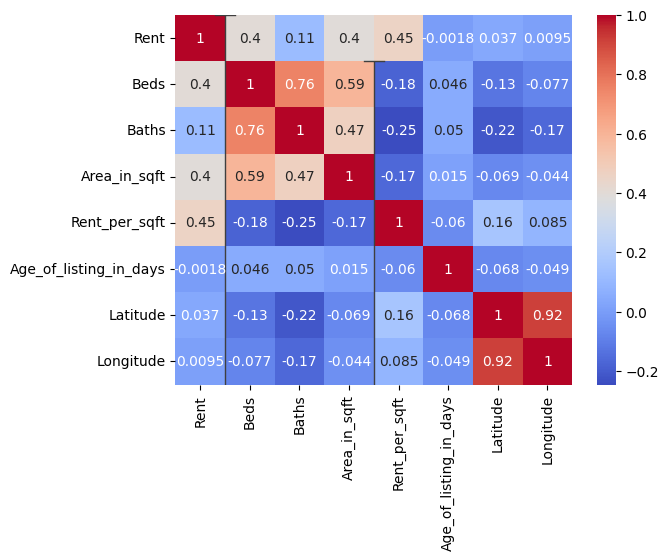

In [5]:

sns.boxplot(x='City', y='Rent', data=train)
sns.heatmap(train.corr(numeric_only=True), annot=True, cmap='coolwarm')

## Correlation Analysis

To understand how the numerical variables relate to one another and to the target (`Rent`),  
I plotted a correlation heatmap for:

- `Rent`  
- `Beds`, `Baths`  
- `Area_in_sqft`, `Rent_per_sqft`  
- `Age_of_listing_in_days`  
- `Latitude`, `Longitude`

### Relationship with Rent

From the heatmap:

- `Beds` and `Rent` show a **moderate positive correlation (~0.40)**  
  → listings with more bedrooms tend to have higher rent.
- `Area_in_sqft` also has a **moderate positive correlation with Rent (~0.40)**  
  → larger units generally cost more.
- `Rent_per_sqft` has the **strongest correlation with Rent (~0.45)**  
  → units that charge more per square foot also have higher total rent.
- `Age_of_listing_in_days`, `Latitude`, and `Longitude` have **very weak correlations** with `Rent`  
  → they are not strong direct predictors of rent on their own.

These patterns are consistent with expectations: bigger units and those with higher price per square foot generally command higher rents.

### Multicollinearity Between Predictors

Some predictors are strongly correlated with each other:

- `Beds` and `Baths` have a **strong positive correlation (~0.76)**  
  → units with more bedrooms usually also have more bathrooms.
- `Latitude` and `Longitude` are **highly correlated (~0.92)**  
  → both capture location, and together they behave similarly.
- `Beds` and `Area_in_sqft` are also positively correlated  
  → larger properties tend to have more bedrooms.

These strong inter-feature correlations indicate potential **multicollinearity**, which is more critical for linear models than for tree-based models.  
For simpler models, it may be reasonable to:
- keep only one of `Latitude` / `Longitude` or replace them with a more aggregated feature (e.g. `City`), and  
- be aware that `Beds`, `Baths`, and `Area_in_sqft` contain overlapping information.

Overall, the correlation analysis confirms that **size-related features (beds, baths, area, rent per sqft)** are the main drivers of rent, while age of listing and raw coordinates play a smaller role.


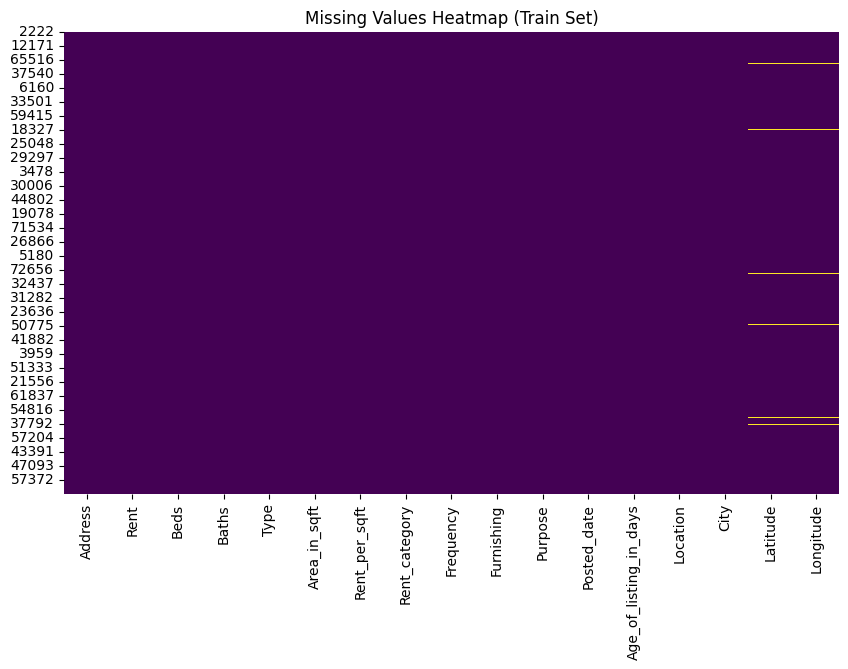

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.heatmap(train.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap (Train Set)")
plt.show()


In [7]:
import plotly.express as px

data_map = train.copy()

# Remove rows without coordinates
data_map = data_map.dropna(subset=['Latitude', 'Longitude'])

fig = px.scatter_mapbox(
    data_map,
    lat="Latitude",
    lon="Longitude",
    hover_name="Address",  
    hover_data=["Rent", "Beds", "Baths"],
    color_discrete_sequence=["fuchsia"],
    zoom=9,        # zoom into Dubai
    height=600
)

# Use OpenStreetMap (no token needed)
fig.update_layout(
    mapbox_style="open-street-map",
    title="Rental Properties in Dubai — Geographical Distribution"
)

fig.show()


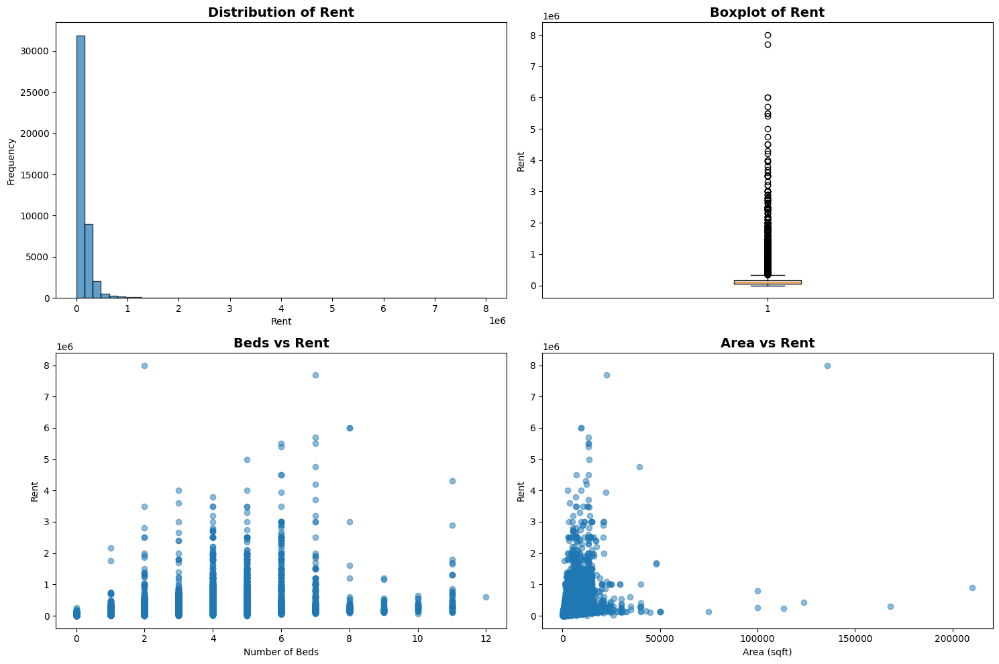

In [8]:
target_col = 'Rent'

# --- Visualizations ---
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Distribution of target variable
axes[0, 0].hist(train[target_col], bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].set_title(f'Distribution of {target_col}', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel(target_col)
axes[0, 0].set_ylabel('Frequency')

# Boxplot for outlier detection
axes[0, 1].boxplot(train[target_col])
axes[0, 1].set_title(f'Boxplot of {target_col}', fontsize=14, fontweight='bold')
axes[0, 1].set_ylabel(target_col)

# Beds vs Rent
if 'Beds' in train.columns:
    axes[1, 0].scatter(train['Beds'], train[target_col], alpha=0.5)
    axes[1, 0].set_title('Beds vs Rent', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Number of Beds')
    axes[1, 0].set_ylabel(target_col)

# Area vs Rent
if 'Area_in_sqft' in train.columns:
    axes[1, 1].scatter(train['Area_in_sqft'], train[target_col], alpha=0.5)
    axes[1, 1].set_title('Area vs Rent', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('Area (sqft)')
    axes[1, 1].set_ylabel(target_col)

plt.tight_layout()
plt.savefig('eda_distributions.png', dpi=300, bbox_inches='tight')
plt.show()





### Distribution of Rent

The histogram shows that **rent values are extremely right-skewed**, with the majority of properties priced below **200,000 AED**.  
This confirms the need for **log transformation**, which stabilizes variance and helps models learn better.


### Summary of Insights

- Rent is **highly skewed**, requiring transformation.
- **Size-related features (Beds, Baths, Area)** show clear but noisy positive relationships with Rent.
- Extreme values and outliers could maybe indicate a diverse property market from apartments to luxury estates.
 
 

In [9]:


# --- Categorical Variables Analysis ---
print("\n--- Categorical Variables Distribution ---")
categorical_cols = train.select_dtypes(include=['object']).columns.tolist()

for col in categorical_cols[:5]:  # Show first 5 categorical columns
    print(f"\n{col}:")
    print(train[col].value_counts().head(10))



--- Categorical Variables Distribution ---

Address:
Address
Khalifa City, Abu Dhabi                              1386
Mohammed Bin Zayed City, Abu Dhabi                    793
Muwaileh 3 Building, Muwailih Commercial, Sharjah     472
Madinat Al Riyadh, Abu Dhabi                          445
Muwaileh Building, Muwailih Commercial, Sharjah       425
Al Shamkha, Abu Dhabi                                 392
Al Yasmeen, Ajman                                     386
UpTown Al Zahia, Al Zahia, Muwaileh, Sharjah          348
Shakhbout City, Abu Dhabi                             291
Al Nahda (Sharjah), Sharjah                           280
Name: count, dtype: int64

Type:
Type
Apartment               33927
Villa                    7736
Townhouse                2038
Hotel Apartment           281
Penthouse                 159
Villa Compound             72
Residential Building       21
Residential Floor           8
Residential Plot            3
Name: count, dtype: int64

Rent_category:
Rent_cat


--- Property Type Analysis ---
                      count          mean     median           std    min  \
Type                                                                        
Apartment             33927  1.089974e+05    75000.0  1.218534e+05      0   
Hotel Apartment         281  2.361946e+05   170000.0  1.949604e+05  44000   
Penthouse               159  4.732773e+05   320000.0  5.717718e+05  42000   
Residential Building     21  1.640162e+06   720000.0  1.918987e+06  55000   
Residential Floor         8  1.365309e+06  1750000.0  8.370995e+05  55000   
Residential Plot          3  8.596633e+04    47400.0  8.970043e+04  21999   
Townhouse              2038  1.921029e+05   175000.0  1.154660e+05  26000   
Villa                  7736  2.814885e+05   170000.0  3.931774e+05      0   
Villa Compound           72  1.893542e+05   125000.0  2.038947e+05  35000   

                          max  
Type                           
Apartment             4000000  
Hotel Apartment       13

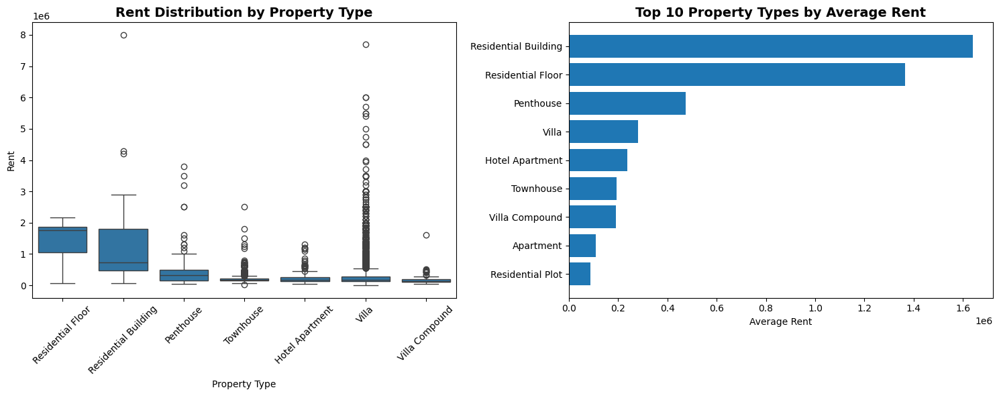

In [10]:
# --- Property Type Analysis ---
if 'Type' in train.columns:
    print("\n--- Property Type Analysis ---")
    type_stats = train.groupby('Type')[target_col].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
    print(type_stats)
    
    # Visualize rent by property type
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Box plot
    type_order = train.groupby('Type')[target_col].median().sort_values(ascending=False).index
    train_plot = train[train['Type'].isin(type_order[:7])]  # Top 7 types
    sns.boxplot(data=train_plot, x='Type', y=target_col, ax=axes[0], order=type_order[:7])
    axes[0].set_title('Rent Distribution by Property Type', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Property Type')
    axes[0].set_ylabel('Rent')
    axes[0].tick_params(axis='x', rotation=45)
    
    # Bar plot of average rent
    type_avg = train.groupby('Type')[target_col].mean().sort_values(ascending=False).head(10)
    axes[1].barh(range(len(type_avg)), type_avg.values)
    axes[1].set_yticks(range(len(type_avg)))
    axes[1].set_yticklabels(type_avg.index)
    axes[1].set_xlabel('Average Rent')
    axes[1].set_title('Top 10 Property Types by Average Rent', fontsize=14, fontweight='bold')
    axes[1].invert_yaxis()
    
    plt.tight_layout()
    plt.savefig('property_type_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()


### Rent by Property Type (Summary)

Property type shows clear differences in rent levels:

- **Residential Building** and **Residential Floor** have the **highest average rents**, indicating these categories include premium or large-scale units.
- **Penthouses** also command very high rents, though they appear less frequently.
- **Villas** show a wide spread with many high-end outliers, reflecting the diversity of villa sizes.
- **Townhouses**, **Hotel Apartments**, and **Villa Compounds** fall in the mid-range.
- **Apartments** and **Residential Plots** have the lowest average rents among the top categories.




--- Location Analysis ---
                               count           mean    median
Location                                                     
Al Reem Island                  2222   99917.878488   86000.0
Jumeirah Village Circle (JVC)   1834   90711.537077   78000.0
Downtown Dubai                  1815  260462.250689  210000.0
Khalifa City                    1656   85427.350845   48000.0
Dubai Marina                    1565  198429.361661  160000.0
Mohammed Bin Zayed City         1272  106307.759434  100000.0
Business Bay                    1245  130787.926908  120000.0
Muwailih Commercial             1219   30988.300246   30000.0
Al Raha Beach                   1043  126162.842761  110000.0
Dubai Creek Harbour             1042  192769.539347  170000.0
Meydan City                      972   92970.863169   65000.0
Palm Jumeirah                    948  542261.566456  250000.0
Muwaileh                         827   47262.744861   40000.0
Yas Island                       694  16495

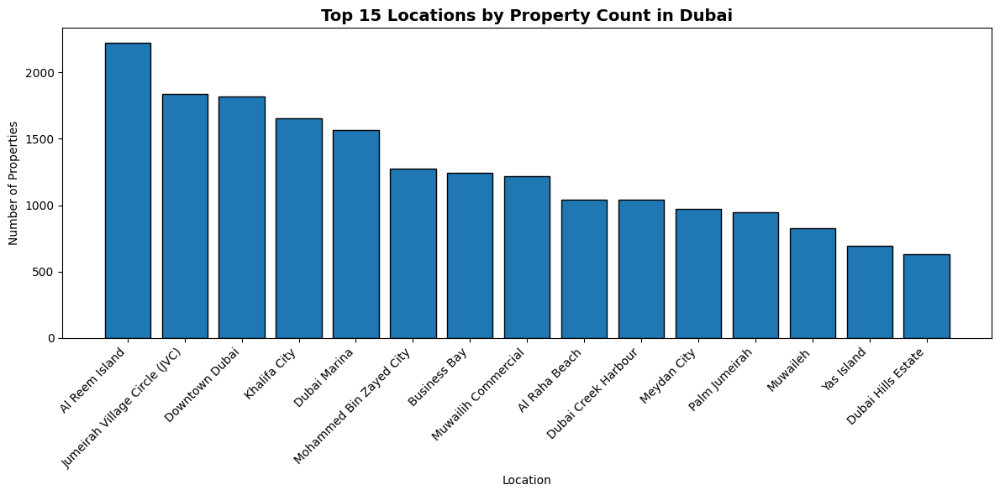

In [11]:
# ---  Location Analysis ---

print("\n--- Location Analysis ---")

# Stats: count, mean rent, median rent
location_stats = (
    train.groupby('Location')[target_col]
    .agg(['count', 'mean', 'median'])
    .sort_values('count', ascending=False)
)
print(location_stats.head(15))

# --- Top 15 Locations by Property Count ---
top_locations = train['Location'].value_counts().head(15)

plt.figure(figsize=(12, 6))
plt.bar(
    range(len(top_locations)),
    top_locations.values,
    edgecolor='black'
)
plt.xticks(
    range(len(top_locations)),
    top_locations.index,
    rotation=45,
    ha='right'
)
plt.xlabel('Location')
plt.ylabel('Number of Properties')
plt.title('Top 15 Locations by Property Count in Dubai', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('location_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


### Property Count by City (Summary)

The dataset is heavily concentrated in a few major cities:

- **Dubai** dominates with the highest number of property listings, making up almost half of the dataset.
- **Abu Dhabi** has the second largest share, followed by **Sharjah**.
- Smaller emirates like **Ajman**, **Al Ain**, **Ras Al Khaimah**, and **Umm Al Quwain** contribute far fewer listings.
- **Fujairah** has the lowest number of properties.

This imbalance indicates that the rental market activity is primarily centred in Dubai and Abu Dhabi, which may influence overall model patterns and average rent distributions.



--- Furnishing Status Analysis ---
             count           mean    median            std
Furnishing                                                
Furnished     9370  204082.871825  135000.0  307084.161955
Unfurnished  34875  130628.770581   87000.0  186895.145884


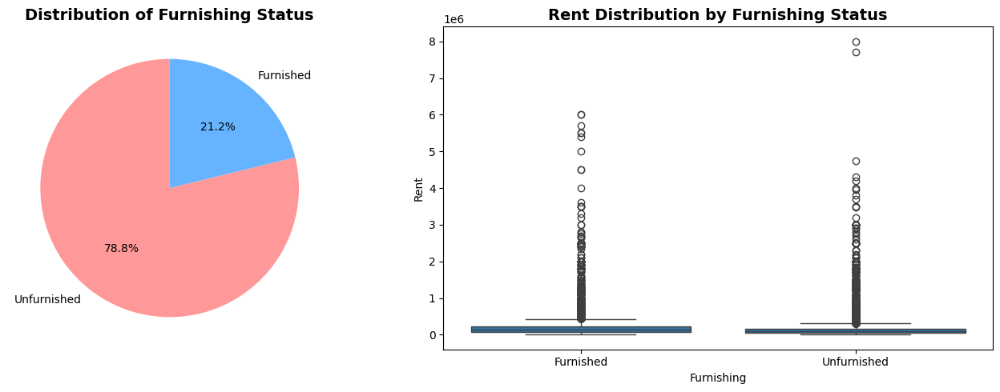

In [12]:
# ---   Furnished vs Unfurnished Analysis ---

print("\n--- Furnishing Status Analysis ---")

# Summary statistics
furnishing_stats = train.groupby('Furnishing')[target_col].agg(['count', 'mean', 'median', 'std'])
print(furnishing_stats)

# Plot setup: Pie chart + Boxplot
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart for distribution of furnishing status
furnishing_counts = train['Furnishing'].value_counts()
axes[0].pie(
    furnishing_counts.values,
    labels=furnishing_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['#ff9999', '#66b3ff', '#99ff99']
)
axes[0].set_title('Distribution of Furnishing Status', fontsize=14, fontweight='bold')

# Boxplot: Rent distribution by furnishing type
sns.boxplot(data=train, x='Furnishing', y=target_col, ax=axes[1])
axes[1].set_title('Rent Distribution by Furnishing Status', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Rent')

plt.tight_layout()
plt.savefig('furnishing_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


### Furnishing Status Analysis (Summary)

The dataset is dominated by **unfurnished** properties, which make up about **79%** of all listings.  
Only **21%** of properties are furnished, indicating that furnished units are much less common in this market.

When comparing rent levels:
- Both furnished and unfurnished properties have **similar median rents**, suggesting furnishing alone does not drastically shift the central rent value.
- Furnished properties show **slightly more high-end outliers**, indicating that some premium listings tend to be offered furnished.
- Overall, furnishing status contributes some variation but is **not as strong a predictor** as size, type, or location.

This suggests that while furnishing may influence rent slightly, it is not a primary driver of pricing in this dataset.



--- Bedrooms and Bathrooms Analysis ---


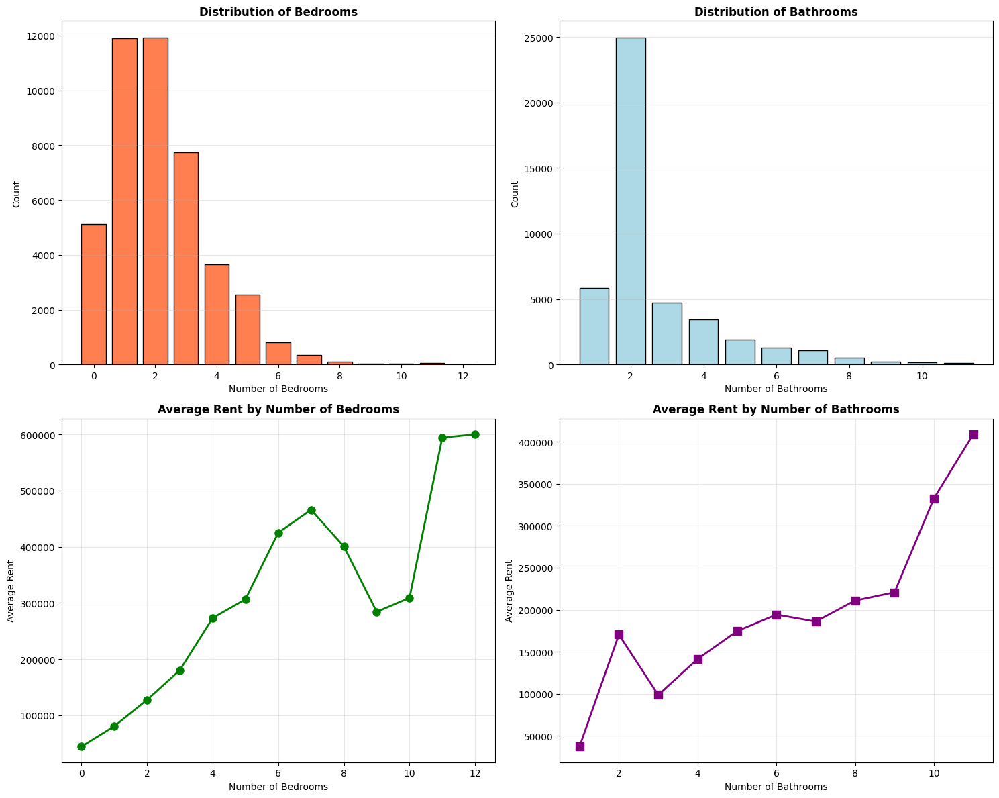


--- Average Rent by Beds and Baths ---
Baths            1             2              3              4   \
Beds                                                              
0      31506.479805  6.056750e+04            NaN            NaN   
1      42851.085388  9.197748e+04   69324.500000            NaN   
2      38824.845638  1.407785e+05  100425.090352  116373.830088   
3      26000.000000  2.502304e+05   95235.723420  141160.689337   
4               NaN  4.067421e+05   92877.311321  171253.478070   
5               NaN  6.297356e+05   90000.000000  196379.275862   
6               NaN  1.240011e+06  100000.000000  111500.000000   
7               NaN  1.473020e+06            NaN            NaN   
8               NaN  2.386874e+06            NaN            NaN   
9               NaN  1.175000e+06            NaN            NaN   
10              NaN  5.000000e+05            NaN            NaN   
11              NaN  1.423333e+06            NaN            NaN   
12              NaN  6

In [13]:
# ---  Beds and Baths Analysis ---
print("\n--- Bedrooms and Bathrooms Analysis ---")

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Beds distribution
beds_counts = train['Beds'].value_counts().sort_index()
axes[0, 0].bar(beds_counts.index, beds_counts.values, color='coral', edgecolor='black')
axes[0, 0].set_xlabel('Number of Bedrooms')
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Distribution of Bedrooms', fontsize=12, fontweight='bold')
axes[0, 0].grid(axis='y', alpha=0.3)

# Baths distribution
baths_counts = train['Baths'].value_counts().sort_index()
axes[0, 1].bar(baths_counts.index, baths_counts.values, color='lightblue', edgecolor='black')
axes[0, 1].set_xlabel('Number of Bathrooms')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Distribution of Bathrooms', fontsize=12, fontweight='bold')
axes[0, 1].grid(axis='y', alpha=0.3)

# Average rent by beds
beds_rent = train.groupby('Beds')[target_col].mean().sort_index()
axes[1, 0].plot(beds_rent.index, beds_rent.values, marker='o', linewidth=2, markersize=8, color='green')
axes[1, 0].set_xlabel('Number of Bedrooms')
axes[1, 0].set_ylabel('Average Rent')
axes[1, 0].set_title('Average Rent by Number of Bedrooms', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# Average rent by baths
baths_rent = train.groupby('Baths')[target_col].mean().sort_index()
axes[1, 1].plot(baths_rent.index, baths_rent.values, marker='s', linewidth=2, markersize=8, color='purple')
axes[1, 1].set_xlabel('Number of Bathrooms')
axes[1, 1].set_ylabel('Average Rent')
axes[1, 1].set_title('Average Rent by Number of Bathrooms', fontsize=12, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('beds_baths_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Cross-tabulation
print("\n--- Average Rent by Beds and Baths ---")
pivot_table = train.pivot_table(values=target_col, index='Beds', columns='Baths', aggfunc='mean')
print(pivot_table)

###  Bedrooms and Bathrooms Analysis (Summary)

#### Distribution Patterns
- Most properties have **1–3 bedrooms**, with very few listings beyond 6 bedrooms.
- Bathrooms follow a similar pattern, with the majority having **1–3 bathrooms** and only a small number exceeding 6.
- These distributions reflect a market dominated by standard-sized family apartments rather than luxury estates.

#### Relationship with Rent
- **Average rent increases steadily with the number of bedrooms**, peaking sharply for large properties (10–12 bedrooms).  
  This indicates that property size is one of the strongest drivers of rental value.
- **Bathrooms also show a positive relationship with rent**, where more bathrooms generally correspond to higher rental prices.
- The upward trend for both features aligns with expectations: larger homes tend to have more rooms and command higher rents.

#### Key Insight
Bedrooms and bathrooms are good indicators of property size, and both exhibit a clear positive relationship with rent.  
However, the relationship becomes noisier for very large properties due to smaller sample sizes, suggesting these extreme values should be interpreted cautiously.



--- Area (Square Feet) Analysis ---
Mean Area: 2052.52 sqft
Median Area: 1334.00 sqft


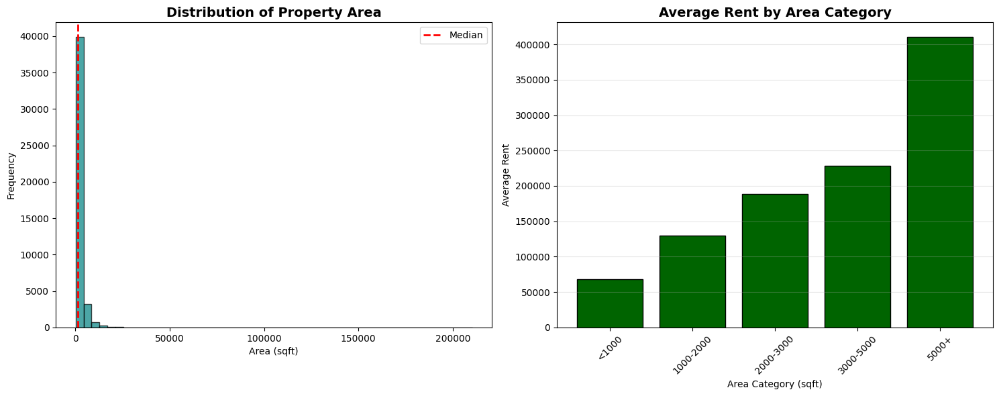

In [14]:
# --- Area Analysis ---
print("\n--- Area (Square Feet) Analysis ---")
print(f"Mean Area: {train['Area_in_sqft'].mean():.2f} sqft")
print(f"Median Area: {train['Area_in_sqft'].median():.2f} sqft")

# Create area bins
train['Area_Category'] = pd.cut(train['Area_in_sqft'], 
                                 bins=[0, 1000, 2000, 3000, 5000, 10000],
                                 labels=['<1000', '1000-2000', '2000-3000', '3000-5000', '5000+'])

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Distribution of area
axes[0].hist(train['Area_in_sqft'], bins=50, edgecolor='black', alpha=0.7, color='teal')
axes[0].set_xlabel('Area (sqft)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Property Area', fontsize=14, fontweight='bold')
axes[0].axvline(train['Area_in_sqft'].median(), color='red', linestyle='--', linewidth=2, label='Median')
axes[0].legend()

# Rent by area category
area_cat_rent = train.groupby('Area_Category')[target_col].mean()
axes[1].bar(range(len(area_cat_rent)), area_cat_rent.values, color='darkgreen', edgecolor='black')
axes[1].set_xticks(range(len(area_cat_rent)))
axes[1].set_xticklabels(area_cat_rent.index, rotation=45)
axes[1].set_xlabel('Area Category (sqft)')
axes[1].set_ylabel('Average Rent')
axes[1].set_title('Average Rent by Area Category', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

###  Property Area Analysis (Summary)

The distribution of property area is extremely right-skewed, with most listings clustered between **500–3000 sqft**.  
The median area is roughly **1334 sqft**, while a small number of very large properties (up to 200,000+ sqft) act as extreme outliers.

When grouping properties into area categories, a clear pattern emerges:

- **Larger properties consistently command higher average rent**
- Rent increases steadily from the `<1000 sqft` group up to the `5000+ sqft` category
- The sharp rise in the 5000+ sqft category reflects luxury villas and high-end estates

Overall, property area is one of the strongest predictors of rental price, showing a clear and intuitive positive relationship with rent.



--- Frequency Analysis ---
Frequency
Yearly    44245
Name: count, dtype: int64

--- Posted Date Analysis ---


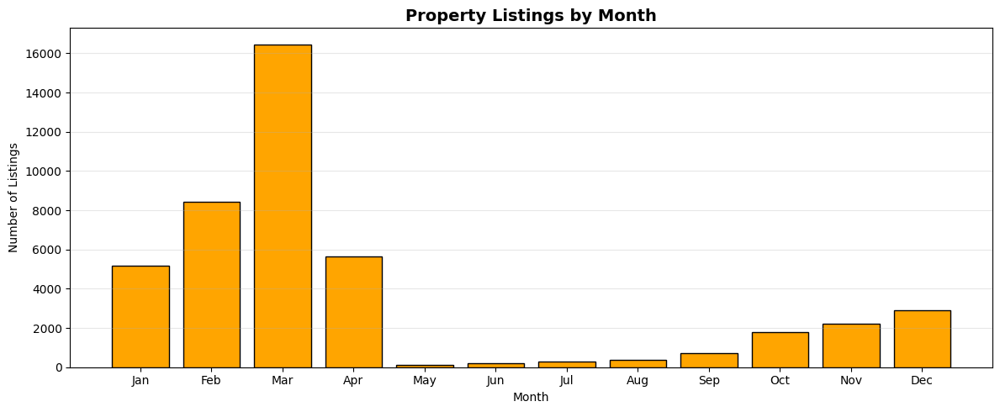

In [15]:
# ---  Frequency and Posted Date Analysis ---
if 'Frequency' in train.columns:
    print("\n--- Frequency Analysis ---")
    print(train['Frequency'].value_counts())

if 'Posted_date' in train.columns:
    print("\n--- Posted Date Analysis ---")
    # Convert to datetime if it's not already
    train_temp = train.copy()
    train_temp['Posted_date'] = pd.to_datetime(train_temp['Posted_date'], errors='coerce')
    
    # Extract month and year
    train_temp['Posted_Month'] = train_temp['Posted_date'].dt.month
    train_temp['Posted_Year'] = train_temp['Posted_date'].dt.year
    
    # Monthly trend
    monthly_counts = train_temp['Posted_Month'].value_counts().sort_index()
    
    plt.figure(figsize=(12, 5))
    plt.bar(monthly_counts.index, monthly_counts.values, color='orange', edgecolor='black')
    plt.xlabel('Month')
    plt.ylabel('Number of Listings')
    plt.title('Property Listings by Month', fontsize=14, fontweight='bold')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('monthly_listings.png', dpi=300, bbox_inches='tight')
    plt.show()


## Data Cleaning

In [16]:
# --- Define cleaning: drop irrelevant & filter unrealistic ---
cols_to_drop = ['Address','Rent_per_sqft','Rent_category', 'Area_Category','Frequency',
                'Posted_date','Latitude','Longitude']

def clean_split(d):
    d = d.drop(columns=cols_to_drop, errors='ignore').copy()
    
    # Filter unrealistic Rent
    if 'Rent' in d.columns:
        d = d[(d['Rent'] >= 20000) & (d['Rent'] <= 1500000)]
    
    # Filter unrealistic Area
    if 'Area_in_sqft' in d.columns:
        d = d[(d['Area_in_sqft'] >= 300) & (d['Area_in_sqft'] <= 70000)]
    
    return d

# Apply same cleaning to each split
train = clean_split(train)
val   = clean_split(val)
test  = clean_split(test)

# --- Separate X / y for each split ---
y_train = train['Rent']; X_train = train.drop('Rent', axis=1)
y_val   = val['Rent'];   X_val   = val.drop('Rent', axis=1)
y_test  = test['Rent'];  X_test  = test.drop('Rent', axis=1)


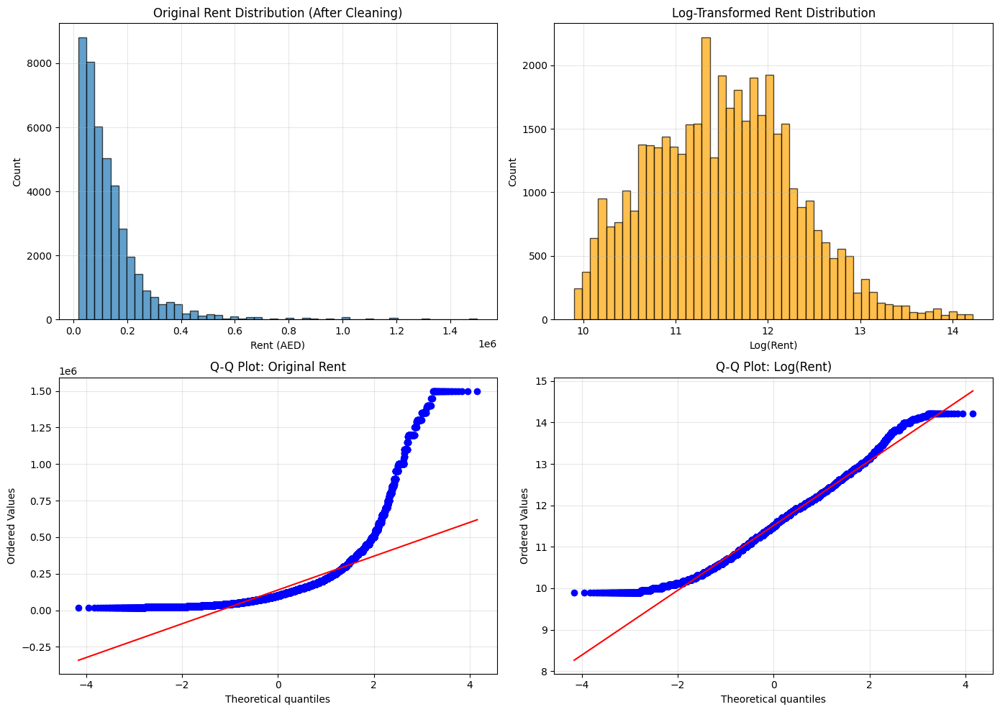

ORIGINAL RENT STATISTICS
Mean:     138,957.94 AED
Median:   100,000.00 AED
Std Dev:  142,844.99 AED
Min:      20,000.00 AED
Max:      1,500,000.00 AED
Skewness: 3.89
Kurtosis: 22.87

LOG(RENT) STATISTICS
Mean:     11.51
Median:   11.51
Std Dev:  0.79
Skewness: 0.27
Kurtosis: -0.15

DATA QUALITY CHECKS
Number of zero rents: 0
Number of negative rents: 0
Number of very low rents (<1000 AED): 0


In [17]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# --- Check distribution of cleaned rent data ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Histogram of original rent
axes[0, 0].hist(y_train, bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].set_xlabel('Rent (AED)')
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Original Rent Distribution (After Cleaning)')
axes[0, 0].grid(alpha=0.3)

# 2. Histogram of log-transformed rent
axes[0, 1].hist(np.log(y_train), bins=50, edgecolor='black', alpha=0.7, color='orange')
axes[0, 1].set_xlabel('Log(Rent)')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Log-Transformed Rent Distribution')
axes[0, 1].grid(alpha=0.3)

# 3. QQ plot for original rent
from scipy import stats
stats.probplot(y_train, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title('Q-Q Plot: Original Rent')
axes[1, 0].grid(alpha=0.3)

# 4. QQ plot for log rent
stats.probplot(np.log(y_train), dist="norm", plot=axes[1, 1])
axes[1, 1].set_title('Q-Q Plot: Log(Rent)')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# --- Print summary statistics ---
print("=" * 50)
print("ORIGINAL RENT STATISTICS")
print("=" * 50)
print(f"Mean:     {y_train.mean():,.2f} AED")
print(f"Median:   {y_train.median():,.2f} AED")
print(f"Std Dev:  {y_train.std():,.2f} AED")
print(f"Min:      {y_train.min():,.2f} AED")
print(f"Max:      {y_train.max():,.2f} AED")
print(f"Skewness: {y_train.skew():.2f}")
print(f"Kurtosis: {y_train.kurtosis():.2f}")

print("\n" + "=" * 50)
print("LOG(RENT) STATISTICS")
print("=" * 50)
log_rent = np.log(y_train)
print(f"Mean:     {log_rent.mean():.2f}")
print(f"Median:   {log_rent.median():.2f}")
print(f"Std Dev:  {log_rent.std():.2f}")
print(f"Skewness: {log_rent.skew():.2f}")
print(f"Kurtosis: {log_rent.kurtosis():.2f}")

# --- Check for zeros or negative values ---
print("\n" + "=" * 50)
print("DATA QUALITY CHECKS")
print("=" * 50)
print(f"Number of zero rents: {(y_train == 0).sum()}")
print(f"Number of negative rents: {(y_train < 0).sum()}")
print(f"Number of very low rents (<1000 AED): {(y_train < 1000).sum()}")

## Feature Engineering

In [18]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# --- 0) Log-transform Area ---
for X in (X_train, X_val, X_test):
    if 'Area_in_sqft' in X.columns:
        X['Log_Area'] = np.log1p(X['Area_in_sqft'])
        X.drop('Area_in_sqft', axis=1, inplace=True)

# --- 1) Binary encoding for Furnishing ---
furnish_map = {"Furnished": 1, "Unfurnished": 0}
for X in (X_train, X_val, X_test):
    if 'Furnishing' in X.columns:
        X['Furnishing'] = X['Furnishing'].map(furnish_map).fillna(0).astype(float)

# --- 2) Drop constant columns explicitly ---
cols_to_drop_always = ['Purpose']
for X in (X_train, X_val, X_test):
    X.drop(cols_to_drop_always, axis=1, inplace=True, errors='ignore')

# --- 3) Select categorical columns for encoding ---
cat_cols = ['Type', 'Location', 'City'] 

print("\nCategorical columns to encode:")
for col in cat_cols:
    print(f"  {col}: {X_train[col].nunique()} unique values")

# --- 4) One-hot encoding ---
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
encoder.fit(X_train[cat_cols])

encoded_feature_names = encoder.get_feature_names_out(cat_cols)

for name, X in [('train', X_train), ('val', X_val), ('test', X_test)]:
    X_encoded = encoder.transform(X[cat_cols])
    X_encoded_df = pd.DataFrame(
        X_encoded,
        columns=encoded_feature_names,
        index=X.index
    )

    X.drop(cat_cols, axis=1, inplace=True)
    X[encoded_feature_names] = X_encoded_df

# --- 5) Scale continuous features ---
cont_cols = ['Beds', 'Baths', 'Age_of_listing_in_days', 'Log_Area', 'Furnishing']
cont_cols = [c for c in cont_cols if c in X_train.columns]

scaler = StandardScaler()
scaler.fit(X_train[cont_cols])

X_train[cont_cols] = scaler.transform(X_train[cont_cols])
X_val[cont_cols]   = scaler.transform(X_val[cont_cols])
X_test[cont_cols]  = scaler.transform(X_test[cont_cols])

# --- 6) Final verification ---
print("\n" + "="*50)
print("FINAL PREPROCESSING SUMMARY")
print("="*50)
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"\nColumns aligned (train vs val):  {all(X_train.columns == X_val.columns)}")
print(f"Columns aligned (train vs test): {all(X_train.columns == X_test.columns)}")
print(f"No NaNs in train: {X_train.isna().sum().sum() == 0}")



Categorical columns to encode:
  Type: 9 unique values
  Location: 408 unique values
  City: 8 unique values

FINAL PREPROCESSING SUMMARY
X_train shape: (43075, 427)
X_val shape:   (14389, 427)
X_test shape:  (14350, 427)

Columns aligned (train vs val):  True
Columns aligned (train vs test): True
No NaNs in train: True


In [19]:
y_train_log = np.log(y_train)
y_val_log   = np.log(y_val)
y_test_log  = np.log(y_test)


In [20]:
print(X_train.columns)

Index(['Beds', 'Baths', 'Furnishing', 'Age_of_listing_in_days', 'Log_Area',
       'Type_Hotel Apartment', 'Type_Penthouse', 'Type_Residential Building',
       'Type_Residential Floor', 'Type_Residential Plot',
       ...
       'Location_Zakhir', 'Location_Zayed City', 'Location_Zayed Sports City',
       'City_Ajman', 'City_Al Ain', 'City_Dubai', 'City_Fujairah',
       'City_Ras Al Khaimah', 'City_Sharjah', 'City_Umm Al Quwain'],
      dtype='object', length=427)


In [21]:
print(X_train.dtypes)


Beds                      float64
Baths                     float64
Furnishing                float64
Age_of_listing_in_days    float64
Log_Area                  float64
                           ...   
City_Dubai                float64
City_Fujairah             float64
City_Ras Al Khaimah       float64
City_Sharjah              float64
City_Umm Al Quwain        float64
Length: 427, dtype: object


# Model Training

In [22]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

# --- Helper to train, predict, and log metrics ---
results = {}
def evaluate_model(name, model, X_train, y_train, X_val, y_val):
    model.fit(X_train, y_train)
    pred_tr = model.predict(X_train)
    pred_va = model.predict(X_val)
    metrics = {
        'train_r2':  r2_score(y_train, pred_tr),
        'train_mae': mean_absolute_error(y_train, pred_tr),
        'train_rmse': mean_squared_error(y_train, pred_tr, squared=False),
        'val_r2':    r2_score(y_val,   pred_va),
        'val_mae':   mean_absolute_error(y_val,   pred_va),
        'val_rmse':  mean_squared_error(y_val,   pred_va, squared=False),
        'model':     model
    }
    results[name] = metrics
    print(f"{name:>20} | "
          f"Train R²={metrics['train_r2']:.3f}  Val R²={metrics['val_r2']:.3f} | "
          f"Val MAE={metrics['val_mae']:.2f}  Val RMSE={metrics['val_rmse']:.2f}")
    return model

# --- Train Multiple Models with LOG-TRANSFORMED target ---
lr = evaluate_model('Linear Regression',
                    LinearRegression(),
                    X_train, y_train_log, X_val, y_val_log)   

ridge = evaluate_model('Ridge Regression',
                       Ridge(alpha=10.0, random_state=42),
                       X_train, y_train_log, X_val, y_val_log)   

rf = evaluate_model('Random Forest',
                    RandomForestRegressor(
                        n_estimators=300, max_depth=20, random_state=42, n_jobs=-1
                    ),
                    X_train, y_train_log, X_val, y_val_log)   

gb = evaluate_model('Gradient Boosting',
                    GradientBoostingRegressor(
                        n_estimators=300, max_depth=3, learning_rate=0.05, random_state=42
                    ),
                    X_train, y_train_log, X_val, y_val_log)   

# --- Select Best Model by Validation R² ---
best_model_name = max(results, key=lambda k: results[k]['val_r2'])
best_model = results[best_model_name]['model']
print("\n" + "="*80)
print(f"BEST MODEL: {best_model_name} (by validation R² = {results[best_model_name]['val_r2']:.3f})")
print("="*80)

   Linear Regression | Train R²=0.912  Val R²=0.911 | Val MAE=0.17  Val RMSE=0.23
    Ridge Regression | Train R²=0.909  Val R²=0.909 | Val MAE=0.18  Val RMSE=0.24
       Random Forest | Train R²=0.960  Val R²=0.925 | Val MAE=0.15  Val RMSE=0.21
   Gradient Boosting | Train R²=0.884  Val R²=0.883 | Val MAE=0.20  Val RMSE=0.27

BEST MODEL: Random Forest (by validation R² = 0.925)


# Model Improvement

In [23]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
import numpy as np
import pandas as pd

# ============================================================================
# HYPERPARAMETER TUNING
# ============================================================================

print("\n" + "="*80)
print("STARTING HYPERPARAMETER TUNING")
print("="*80 + "\n")

# --- 1) Random Forest Hyperparameter Tuning ---
print("Tuning Random Forest...")
rf_param_grid = {
    'n_estimators': [200, 300],
    'max_depth': [20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt']
}
rf_grid = GridSearchCV(
    RandomForestRegressor(random_state=42, n_jobs=-1),
    param_grid=rf_param_grid,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1
)

rf_grid.fit(X_train, y_train_log)

print(f"\nBest Random Forest Parameters: {rf_grid.best_params_}")
print(f"Best CV R² Score: {rf_grid.best_score_:.4f}")

# Evaluate on validation set
rf_best = rf_grid.best_estimator_
rf_val_pred = rf_best.predict(X_val)
rf_val_r2 = r2_score(y_val_log, rf_val_pred)
rf_val_mae = mean_absolute_error(y_val_log, rf_val_pred)
rf_val_rmse = mean_squared_error(y_val_log, rf_val_pred, squared=False)

print(f"Random Forest Validation R²: {rf_val_r2:.4f}")
print(f"Random Forest Validation MAE: {rf_val_mae:.4f}")
print(f"Random Forest Validation RMSE: {rf_val_rmse:.4f}")

# --- 2) Gradient Boosting Hyperparameter Tuning ---
print("\n" + "-"*80)
print("Tuning Gradient Boosting...")
gb_param_grid = {
    'n_estimators': [200, 300],
    'max_depth': [3, 4],
    'learning_rate': [0.05, 0.1],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'subsample': [0.8, 1.0]
}


gb_grid = GridSearchCV(
    GradientBoostingRegressor(random_state=42),
    param_grid=gb_param_grid,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1
)

gb_grid.fit(X_train, y_train_log)

print(f"\nBest Gradient Boosting Parameters: {gb_grid.best_params_}")
print(f"Best CV R² Score: {gb_grid.best_score_:.4f}")

# Evaluate on validation set
gb_best = gb_grid.best_estimator_
gb_val_pred = gb_best.predict(X_val)
gb_val_r2 = r2_score(y_val_log, gb_val_pred)
gb_val_mae = mean_absolute_error(y_val_log, gb_val_pred)
gb_val_rmse = mean_squared_error(y_val_log, gb_val_pred, squared=False)

print(f"Gradient Boosting Validation R²: {gb_val_r2:.4f}")
print(f"Gradient Boosting Validation MAE: {gb_val_mae:.4f}")
print(f"Gradient Boosting Validation RMSE: {gb_val_rmse:.4f}")

# --- 3) Ridge Regression Hyperparameter Tuning ---
print("\n" + "-"*80)
print("Tuning Ridge Regression...")
ridge_param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100, 1000]
}

ridge_grid = GridSearchCV(
    Ridge(random_state=42),
    param_grid=ridge_param_grid,
    cv=3,
    scoring='r2',
    verbose=1,
    n_jobs=-1
)


ridge_grid.fit(X_train, y_train_log)

print(f"\nBest Ridge Parameters: {ridge_grid.best_params_}")
print(f"Best CV R² Score: {ridge_grid.best_score_:.4f}")

# Evaluate on validation set
ridge_best = ridge_grid.best_estimator_
ridge_val_pred = ridge_best.predict(X_val)
ridge_val_r2 = r2_score(y_val_log, ridge_val_pred)
ridge_val_mae = mean_absolute_error(y_val_log, ridge_val_pred)
ridge_val_rmse = mean_squared_error(y_val_log, ridge_val_pred, squared=False)

print(f"Ridge Validation R²: {ridge_val_r2:.4f}")
print(f"Ridge Validation MAE: {ridge_val_mae:.4f}")
print(f"Ridge Validation RMSE: {ridge_val_rmse:.4f}")

# ============================================================================
# COMPARE ALL TUNED MODELS
# ============================================================================
print("\n" + "="*80)
print("TUNED MODELS COMPARISON")
print("="*80)

tuned_results = {
    'Random Forest': {'r2': rf_val_r2, 'mae': rf_val_mae, 'rmse': rf_val_rmse, 'model': rf_best},
    'Gradient Boosting': {'r2': gb_val_r2, 'mae': gb_val_mae, 'rmse': gb_val_rmse, 'model': gb_best},
    'Ridge Regression': {'r2': ridge_val_r2, 'mae': ridge_val_mae, 'rmse': ridge_val_rmse, 'model': ridge_best}
}

# Print comparison table
print(f"\n{'Model':<25} {'Val R²':<12} {'Val MAE':<12} {'Val RMSE':<12}")
print("-"*80)
for name, metrics in tuned_results.items():
    print(f"{name:<25} {metrics['r2']:<12.4f} {metrics['mae']:<12.4f} {metrics['rmse']:<12.4f}")

# Select best model
best_tuned_name = max(tuned_results, key=lambda k: tuned_results[k]['r2'])
best_tuned_model = tuned_results[best_tuned_name]['model']

print("\n" + "="*80)
print(f"BEST TUNED MODEL: {best_tuned_name}")
print(f"Validation R²: {tuned_results[best_tuned_name]['r2']:.4f}")
print(f"Validation MAE: {tuned_results[best_tuned_name]['mae']:.4f}")
print(f"Validation RMSE: {tuned_results[best_tuned_name]['rmse']:.4f}")
print("="*80)






STARTING HYPERPARAMETER TUNING

Tuning Random Forest...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best Random Forest Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Best CV R² Score: 0.9374
Random Forest Validation R²: 0.9394
Random Forest Validation MAE: 0.1337
Random Forest Validation RMSE: 0.1927

--------------------------------------------------------------------------------
Tuning Gradient Boosting...
Fitting 5 folds for each of 64 candidates, totalling 320 fits

Best Gradient Boosting Parameters: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300, 'subsample': 0.8}
Best CV R² Score: 0.9163
Gradient Boosting Validation R²: 0.9165
Gradient Boosting Validation MAE: 0.1695
Gradient Boosting Validation RMSE: 0.2262

--------------------------------------------------------------------------------
Tuning Ridge Regression...
Fitting 3 fo

In [24]:
# ============================================================================
# FINAL TEST SET EVALUATION
# ============================================================================
print("\n" + "="*80)
print("FINAL TEST SET EVALUATION")
print("="*80)

# Predict on test set (log scale)
pred_test_log = best_tuned_model.predict(X_test)

# Metrics in log scale
test_r2_log = r2_score(y_test_log, pred_test_log)
test_mae_log = mean_absolute_error(y_test_log, pred_test_log)
test_rmse_log = mean_squared_error(y_test_log, pred_test_log, squared=False)

print(f"\nTest Set Performance (Log Scale):")
print(f"  R²: {test_r2_log:.4f}")
print(f"  MAE: {test_mae_log:.4f}")
print(f"  RMSE: {test_rmse_log:.4f}")

# Convert back to original scale
y_test_orig = np.exp(y_test_log)
pred_test_orig = np.exp(pred_test_log)

# Filter out any infinite values
mask = np.isfinite(y_test_orig) & np.isfinite(pred_test_orig)
y_test_orig_clean = y_test_orig[mask]
pred_test_orig_clean = pred_test_orig[mask]

# Metrics in original scale
test_r2_orig = r2_score(y_test_orig_clean, pred_test_orig_clean)  # ← ADDED THIS
test_mae_orig = mean_absolute_error(y_test_orig_clean, pred_test_orig_clean)
test_rmse_orig = mean_squared_error(y_test_orig_clean, pred_test_orig_clean, squared=False)

# MAPE in original scale
test_mape_orig = np.mean(
    np.abs((y_test_orig_clean - pred_test_orig_clean) / y_test_orig_clean)
) * 100

print(f"\nTest Set Performance (Original Scale):")
print(f"  R²:   {test_r2_orig:.4f}")  
print(f"  MAE: {test_mae_orig:,.2f}")
print(f"  RMSE: {test_rmse_orig:,.2f}")
print(f"  MAPE: {test_mape_orig:.2f}%")



FINAL TEST SET EVALUATION

Test Set Performance (Log Scale):
  R²: 0.9407
  MAE: 0.1346
  RMSE: 0.1926

Test Set Performance (Original Scale):
  R²:   0.8448
  MAE: 22,714.37
  RMSE: 59,382.85
  MAPE: 13.53%


In [25]:
import pandas as pd

importances = best_tuned_model.feature_importances_

feat_imp = (
    pd.DataFrame({"Feature": X_train.columns, "Importance": importances})
    .sort_values("Importance", ascending=False)
    .reset_index(drop=True)
)

# Round for cleaner display
feat_imp["Importance"] = feat_imp["Importance"].round(4)

feat_imp.style.set_properties(**{
    'text-align': 'left',
}).set_table_styles([
    dict(selector='th', props=[('text-align', 'left')])
])


,Feature,Importance
0,Log_Area,0.177600
1,Beds,0.160300
2,Baths,0.103400
3,City_Dubai,0.093500
4,City_Sharjah,0.050200
5,Type_Villa,0.040800
6,Furnishing,0.029500
7,City_Ajman,0.027700
8,Location_Downtown Dubai,0.027100
9,Age_of_listing_in_days,0.025800


# Save Model

In [32]:
import joblib

joblib.dump(best_tuned_model, "my_model.pkl")


['my_model.pkl']

In [33]:
import pickle
import numpy as np
import pandas as pd
from datetime import datetime

print("="*80)
print("SAVING MODEL + FULL PREPROCESSING PIPELINE (PICKLE)")
print("="*80 + "\n")

# 1) Save trained model
print("1. Saving trained model...")
with open("best_model.pkl", "wb") as f:
    pickle.dump(best_tuned_model, f)
print("   ✓ Saved as best_model.pkl")

# 2) Save scaler
print("2. Saving StandardScaler...")
with open("scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)
print("   ✓ Saved scaler.pkl")

# 3) Save OneHotEncoder
print("3. Saving OneHotEncoder...")
with open("encoder.pkl", "wb") as f:
    pickle.dump(encoder, f)
print("   ✓ Saved encoder.pkl")

# 4) Save ORIGINAL categorical columns (CRITICAL!)
print("4. Saving categorical columns...")
categorical_cols = ['Type', 'Location', 'City']  # ← ADD THIS!
with open("categorical_cols.pkl", "wb") as f:
    pickle.dump(categorical_cols, f)
print(f"   ✓ Saved {len(categorical_cols)} categorical columns: {categorical_cols}")

# 5) Save continuous columns
print("5. Saving continuous columns...")
continuous_cols = ['Beds', 'Baths', 'Age_of_listing_in_days', 'Log_Area', 'Furnishing']
with open("continuous_cols.pkl", "wb") as f:
    pickle.dump(continuous_cols, f)
print(f"   ✓ Saved {len(continuous_cols)} continuous columns")

# 6) Save final feature column order
print("6. Saving final training columns...")
feature_columns = X_train.columns.tolist()
with open("feature_columns.pkl", "wb") as f:
    pickle.dump(feature_columns, f)
print(f"   ✓ Saved {len(feature_columns)} feature names")

# 7) Save furnishing mapping
print("7. Saving furnishing map...")
furnish_map = {"Furnished": 1, "Unfurnished": 0}
with open("furnish_map.pkl", "wb") as f:
    pickle.dump(furnish_map, f)
print("   ✓ Saved furnish_map.pkl")

# 8) Save model metadata
print("8. Saving model metadata...")
model_info = {
    "model_name": best_tuned_name,
    "model_type": type(best_tuned_model).__name__,
    "training_date": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "validation_r2": float(tuned_results[best_tuned_name]["r2"]),
    "validation_mae": float(tuned_results[best_tuned_name]["mae"]),
    "validation_rmse": float(tuned_results[best_tuned_name]["rmse"]),
    "target_transform": "log → use np.exp() to invert",
    "categorical_features": categorical_cols,   
    "continuous_features": continuous_cols
}
with open("model_info.pkl", "wb") as f:
    pickle.dump(model_info, f)
print("   ✓ Saved model_info.pkl")

print("\n" + "="*80)
print("ALL FILES SAVED SUCCESSFULLY!")
print("="*80)
print("\nFiles created:")
print("  • best_model.pkl        - Trained model")
print("  • scaler.pkl            - StandardScaler for continuous features")
print("  • encoder.pkl           - OneHotEncoder for categorical features")
print("  • categorical_cols.pkl  - Original categorical column names")
print("  • continuous_cols.pkl   - Continuous column names")
print("  • feature_columns.pkl   - Final feature order after encoding")
print("  • furnish_map.pkl       - Furnishing mapping dictionary")
print("  • model_info.pkl        - Model metadata and performance")
print("\n✓ Ready for Flask deployment!")

SAVING MODEL + FULL PREPROCESSING PIPELINE (PICKLE)

1. Saving trained model...
   ✓ Saved as best_model.pkl
2. Saving StandardScaler...
   ✓ Saved scaler.pkl
3. Saving OneHotEncoder...
   ✓ Saved encoder.pkl
4. Saving categorical columns...
   ✓ Saved 3 categorical columns: ['Type', 'Location', 'City']
5. Saving continuous columns...
   ✓ Saved 5 continuous columns
6. Saving final training columns...
   ✓ Saved 427 feature names
7. Saving furnishing map...
   ✓ Saved furnish_map.pkl
8. Saving model metadata...
   ✓ Saved model_info.pkl

ALL FILES SAVED SUCCESSFULLY!

Files created:
  • best_model.pkl        - Trained model
  • scaler.pkl            - StandardScaler for continuous features
  • encoder.pkl           - OneHotEncoder for categorical features
  • categorical_cols.pkl  - Original categorical column names
  • continuous_cols.pkl   - Continuous column names
  • feature_columns.pkl   - Final feature order after encoding
  • furnish_map.pkl       - Furnishing mapping dictionary

In [34]:
def preprocess_and_predict(input_data):
    """
    Preprocess input and make prediction.
    
    Input example:
    {
        'Area_in_sqft': 1500,
        'Beds': 3,
        'Baths': 2,
        'Age_of_listing_in_days': 30,
        'Furnishing': 'Furnished',
        'Type': 'Apartment',
        'Location': 'Dubai Marina',
        'City': 'Dubai'  
    }
    """
    # Load all components
    model = pickle.load(open("best_model.pkl", "rb"))
    scaler = pickle.load(open("scaler.pkl", "rb"))
    encoder = pickle.load(open("encoder.pkl", "rb"))
    categorical_cols = pickle.load(open("categorical_cols.pkl", "rb"))  # ← LOAD THIS!
    continuous_cols = pickle.load(open("continuous_cols.pkl", "rb"))
    feature_columns = pickle.load(open("feature_columns.pkl", "rb"))
    furnish_map = pickle.load(open("furnish_map.pkl", "rb"))
    
    # Convert to DataFrame
    df = pd.DataFrame([input_data])
    
    # 1. Log transform area
    df['Log_Area'] = np.log1p(df['Area_in_sqft'])
    df.drop('Area_in_sqft', axis=1, inplace=True)
    
    # 2. Binary encode furnishing
    df['Furnishing'] = df['Furnishing'].map(furnish_map).fillna(0).astype(float)
    
    # 3. One-hot encode categorical features (includes City!)
    df_encoded = encoder.transform(df[categorical_cols])  # ← NOW INCLUDES CITY!
    encoded_cols = encoder.get_feature_names_out(categorical_cols)
    
    df.drop(categorical_cols, axis=1, inplace=True)
    for i, col in enumerate(encoded_cols):
        df[col] = df_encoded[:, i]
    
    # 4. Scale continuous features
    df[continuous_cols] = scaler.transform(df[continuous_cols])
    
    # 5. Ensure correct column order
    df = df[feature_columns]
    
    # 6. Predict (log scale)
    prediction_log = model.predict(df)[0]
    
    # 7. Convert to original scale
    prediction_aed = np.exp(prediction_log)
    
    return prediction_aed


# Test EXAMPLE Usage

In [37]:

# ============================================================================
# EXAMPLE USAGE
# ============================================================================

print("\n" + "="*80)
print("EXAMPLE PREDICTION")
print("="*80 + "\n")

# Example input (with ORIGINAL column names)

# Test it
example_input = {
    'Area_in_sqft': 1500,
    'Beds': 3,
    'Baths': 2,
    'Age_of_listing_in_days': 30,
    'Furnishing': 'Furnished',
    'Type': 'Apartment',
    'Location': 'Dubai Marina',
    'City': 'Dubai' 
}

predicted_rent = preprocess_and_predict(example_input)
print(f"Predicted annual rent: {predicted_rent:,.2f} AED")

# Make prediction
try:
    predicted_price = preprocess_and_predict(example_input)
    print(f"Input: {example_input}")
    print(f"Predicted annual rent: {predicted_rent:,.2f} AED")

except Exception as e:
    print(f"Note: Can't run example yet - files need to be saved first")
    print(f"Error: {e}")

print("\n" + "="*80)
print("READY FOR DEPLOYMENT!")
print("="*80)


EXAMPLE PREDICTION

Predicted annual rent: 197,465.33 AED
Input: {'Area_in_sqft': 1500, 'Beds': 3, 'Baths': 2, 'Age_of_listing_in_days': 30, 'Furnishing': 'Furnished', 'Type': 'Apartment', 'Location': 'Dubai Marina', 'City': 'Dubai'}
Predicted annual rent: 197,465.33 AED

READY FOR DEPLOYMENT!


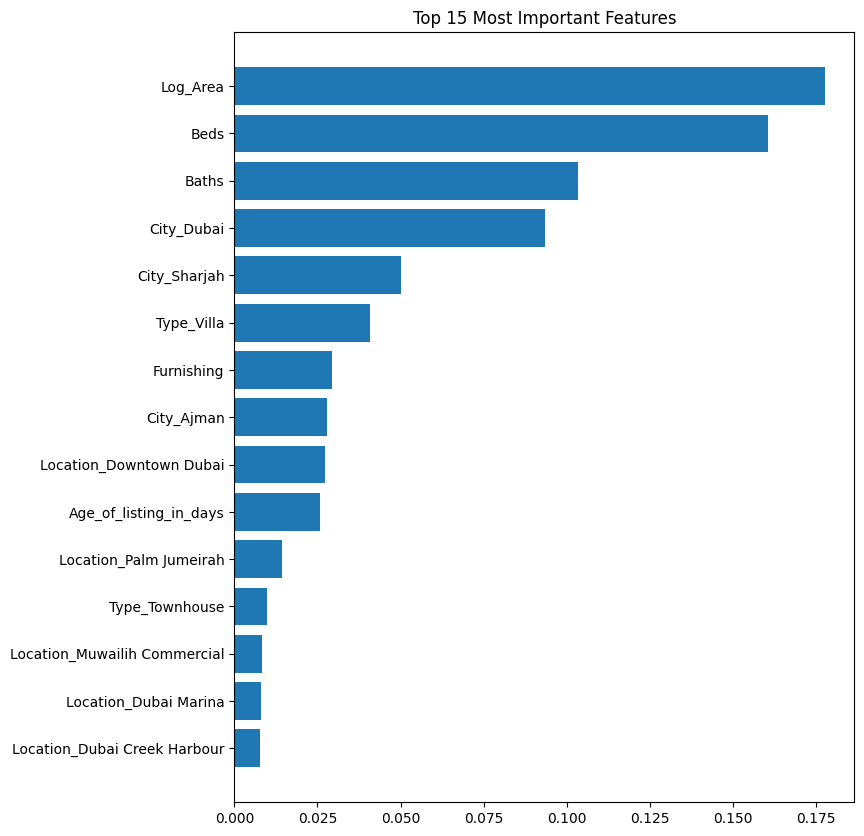

In [36]:
import matplotlib.pyplot as plt
import numpy as np

importances = best_tuned_model.feature_importances_
indices = np.argsort(importances)[-15:]   # top 15 features

plt.figure(figsize=(8,10))
plt.barh(np.array(feature_columns)[indices], importances[indices])
plt.title("Top 15 Most Important Features")
plt.show()


------

 
# **Final Summary and Conclusion**

## **Overview**

This project built a complete machine learning system for predicting annual rental prices of residential properties across the United Arab Emirates (UAE). The workflow included data cleaning, exploratory analysis, feature engineering, model training, hyperparameter tuning, evaluation on a held-out test set, and preparing all necessary components for deployment.

---

## **Data Cleaning and Preparation**

To ensure high-quality inputs for the model:

* Removed unrealistic rental prices below **20,000 AED** and above **1,500,000 AED**.
* Removed extreme property size outliers (below **300 sqft** or above **70,000 sqft**).
* Dropped non-predictive fields such as *Address, Latitude, Longitude, Frequency,* and *Posted_date*.
* Removed constant or non-useful columns such as *Purpose*.
* Confirmed that no missing values remained in the cleaned dataset.
* Applied **log transformation to Area_in_sqft** to reduce skew.
* Trained the model on **log-transformed Rent** for more stable prediction behaviour.

---

## **Feature Engineering**

The following transformations were applied:

* Encoded **Furnishing** using a numerical mapping.
* Created **Log_Area** using natural logarithm.
* Applied **One-Hot Encoding** to all categorical variables, including **Type, Location, and City**, ensuring coverage for all UAE property listings.
* Scaled continuous variables:

  * Beds
  * Baths
  * Age_of_listing_in_days
  * Furnishing
  * Log_Area
* Ensured that all datasets (train, validation, and test) shared identical feature columns.

---

## **Model Training and Evaluation**

A tuned **Random Forest Regressor** was selected and trained using the engineered dataset. Final performance was evaluated on the test split.

### **Test Set Performance (Log Scale)**

* **R²:** 0.9407
* **MAE:** 0.1346
* **RMSE:** 0.1926

### **Test Set Performance (Original AED Scale)**

* **R²:** 0.8448
* **MAE:** 22,714.37 AED
* **RMSE:** 59,382.85 AED
* **MAPE:** 13.53%


---

## **Model Export and Deployment Readiness**

All components required for real-world inference were saved using pickle:

* **best_model.pkl** – trained Random Forest model
* **scaler.pkl** – StandardScaler for continuous features
* **encoder.pkl** – OneHotEncoder for categorical features
* **categorical_cols.pkl** – list of original categorical columns (`['Type', 'Location', 'City']`)
* **continuous_cols.pkl** – list of numerical columns
* **feature_columns.pkl** – full final feature list (427 columns)
* **furnish_map.pkl** – mapping used to convert furnishing to numeric form
* **model_info.pkl** – metadata including performance metrics


In [ ]:
import pickle
import joblib

# Load original model
with open("best_model.pkl", "rb") as f:
    model = pickle.load(f)

# Save compressed model
joblib.dump(
    model,
    "best_model_compressed_lzma.pkl",
    compress=("lzma", 9)
)
